In [ ]:
import torchaudio
import IPython
import numpy as np
import torch
import matplotlib.pyplot as plt


In [ ]:
from google.colab import files

uploaded = files.upload()

Saving sample-speech-1m.wav to sample-speech-1m.wav


In [ ]:
IPython.display.Audio("sample-speech-1m.wav")

In [ ]:

waveform, sample_rate = torchaudio.load("sample-speech-1m.wav")

print(waveform.shape)
print(sample_rate)

torch.Size([1, 2646016])
44100


In [ ]:
new_sample=torchaudio.functional.resample(waveform,orig_freq=44100,new_freq=16000)

In [ ]:
skew_sample=torch.squeeze(new_sample)

In [ ]:
print(skew_sample.shape)

torch.Size([960006])


In [ ]:
IPython.display.Audio(np.array(skew_sample),rate=16000)

/tmp/ipykernel_1344/855943883.py:1: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  IPython.display.Audio(np.array(skew_sample),rate=16000)


In [ ]:
window = torch.hann_window(400)

In [ ]:
tranformed=torch.stft(skew_sample,n_fft=400, hop_length=160, win_length=400,return_complex=True,window=window)

In [ ]:
tranformed.shape

torch.Size([201, 6001])

In [ ]:
spectrogram = torch.abs(tranformed)

print("STFT shape:", tranformed.shape)
print("Spectrogram shape:", spectrogram.shape)
print("Spectrogram dtype:", spectrogram.dtype)

STFT shape: torch.Size([201, 6001])
Spectrogram shape: torch.Size([201, 6001])
Spectrogram dtype: torch.float32


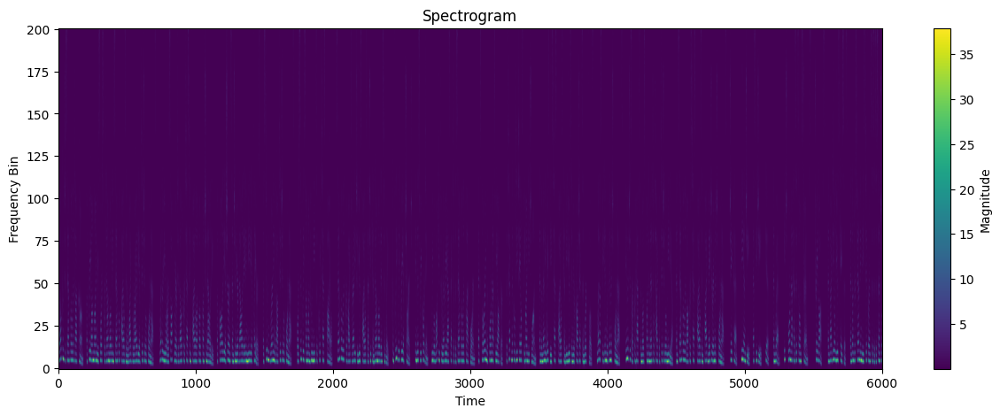

In [ ]:
plt.figure(figsize=(15, 5))

plt.imshow(
    spectrogram.numpy(),
    origin="lower",
    aspect="auto"
)

plt.xlabel("Time")
plt.ylabel("Frequency Bin")
plt.title("Spectrogram")

plt.colorbar(label="Magnitude")
plt.show()

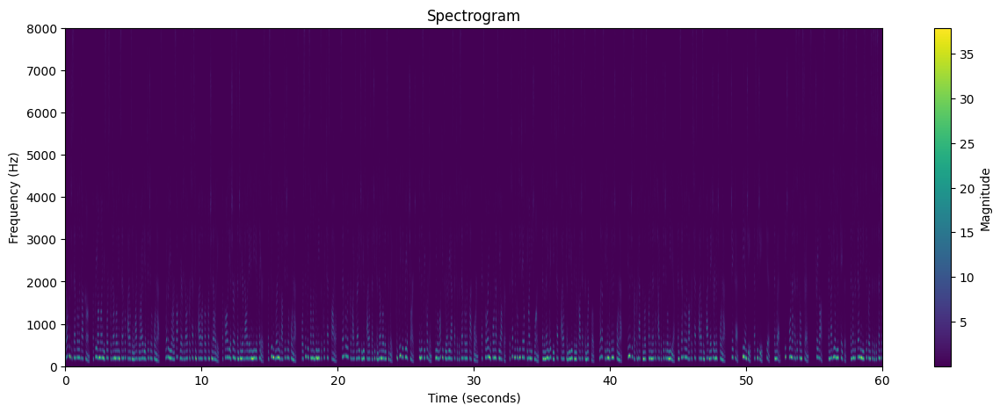

In [ ]:
sample_rate = 16000
n_fft = 400
hop_length = 160

plt.figure(figsize=(15, 5))

plt.imshow(
    spectrogram.numpy(),
    origin="lower",
    aspect="auto",
    extent=[
        0,                              # start time
        spectrogram.shape[1] * hop_length / sample_rate,  # end time
        0,                              # start frequency
        sample_rate / 2                 # max frequency
    ]
)

plt.xlabel("Time (seconds)")
plt.ylabel("Frequency (Hz)")
plt.title("Spectrogram")

plt.colorbar(label="Magnitude")
plt.show()

In [ ]:


sample_rate = 16000
n_fft = 400
win_length = 400
hop_length = 160
n_mels = 80

transform = torchaudio.transforms.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    n_mels=n_mels
)

mel_spectrogram = transform(skew_sample)

print(mel_spectrogram.shape)

torch.Size([80, 6001])


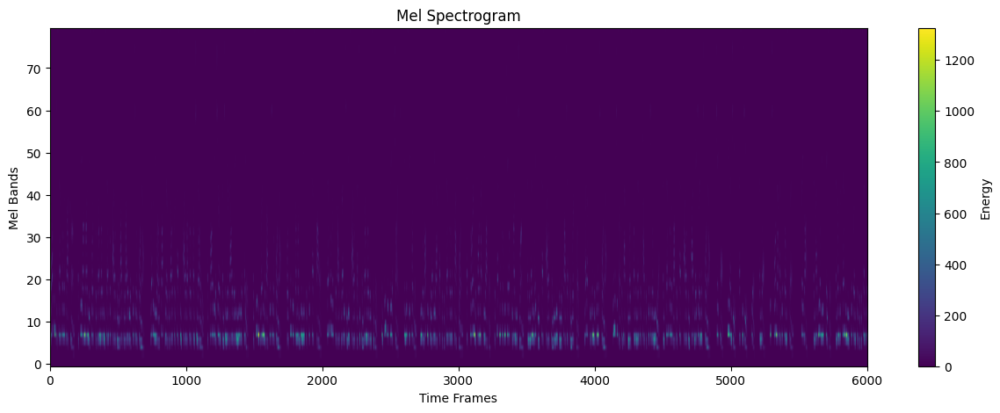

In [ ]:
plt.figure(figsize=(15, 5))

plt.imshow(
    mel_spectrogram.numpy(),
    origin="lower",
    aspect="auto"
)

plt.xlabel("Time Frames")
plt.ylabel("Mel Bands")
plt.title("Mel Spectrogram")

plt.colorbar(label="Energy")

plt.show()

In [ ]:
log_mel = torch.log(mel_spectrogram + 1e-9)

print(log_mel.shape)
print(log_mel.min())
print(log_mel.max())

torch.Size([80, 6001])
tensor(-20.7226)
tensor(7.1899)


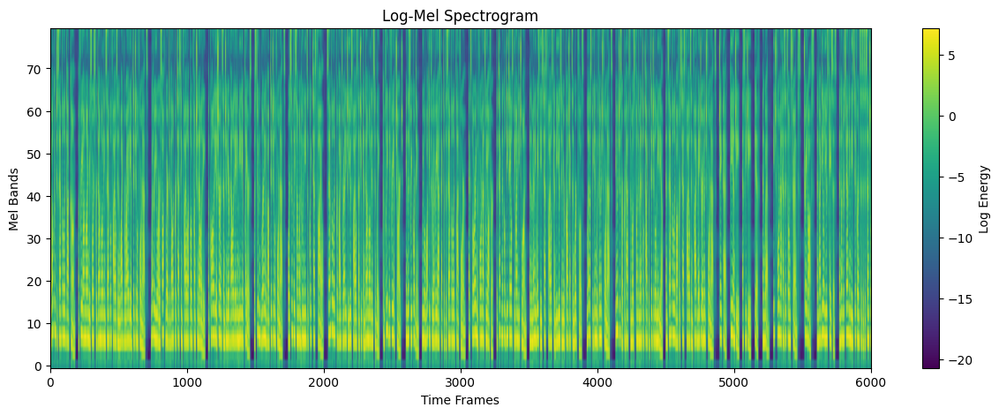

In [ ]:
plt.figure(figsize=(15, 5))

plt.imshow(
    log_mel.numpy(),
    origin="lower",
    aspect="auto"
)

plt.xlabel("Time Frames")
plt.ylabel("Mel Bands")
plt.title("Log-Mel Spectrogram")

plt.colorbar(label="Log Energy")

plt.show()

In [ ]:
mean = log_mel.mean()
std = log_mel.std()

normalized_mel = (log_mel - mean) / (std + 1e-9)

REAL PROJECT STARTS PREPROCESSING STEPS CONFIRMED

In [ ]:

from torch.utils.data import Dataset


class SpeechDataset(Dataset):

    def __init__(self, data):

        self.data = data

        self.mel_transform = torchaudio.transforms.MelSpectrogram(
            sample_rate=16000,
            n_fft=400,
            win_length=400,
            hop_length=160,
            n_mels=80
        )

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):

        # Get information about this example
        audio_path = self.data[index]["audio"]
        text = self.data[index]["text"]

        # 1. Load audio
        waveform, sample_rate = torchaudio.load(audio_path)

        # 2. Convert stereo → mono if necessary
        if waveform.shape[0] > 1:
            waveform = waveform.mean(dim=0)
        else:
            waveform = waveform.squeeze(0)

        # 3. Resample → 16 kHz
        if sample_rate != 16000:
            waveform = torchaudio.functional.resample(
                waveform,
                orig_freq=sample_rate,
                new_freq=16000
            )

        # 4. Waveform → Mel Spectrogram
        mel = self.mel_transform(waveform)

        # 5. Convert to log scale
        mel = torch.log(mel + 1e-9)

        # 6. Normalize
        mean = mel.mean()
        std = mel.std()

        mel = (mel - mean) / (std + 1e-9)

        # Return model input + target
        return mel, text

In [ ]:
data = [
    {"audio": "001.wav", "text": "hello how are you"},
    {"audio": "002.wav", "text": "i like machine learning"},
    {"audio": "003.wav", "text": "good morning"}
]

dataset = SpeechDataset(data)



In [ ]:
from torch.nn.utils.rnn import pad_sequence


def collate_fn(batch):

    # Separate features and transcripts
    features = [item[0] for item in batch]
    texts = [item[1] for item in batch]

    # [Mel, Time] → [Time, Mel]
    features = [x.transpose(0, 1) for x in features]

    # Pad different time lengths
    features = pad_sequence(
        features,
        batch_first=True
    )

    # [Batch, Time, Mel]
    return features, texts

In [ ]:
from torch.utils.data import DataLoader

loader = DataLoader(
    dataset,
    batch_size=3,
    shuffle=True,
    collate_fn=collate_fn
)

In [ ]:
!pip install -q datasets

In [ ]:
from datasets import load_dataset

In [ ]:
def convert_to_mono(waveform):
    if waveform.shape[0] > 1:


        waveform = waveform.mean(dim=0)
    else:
        waveform = waveform.squeeze(0)

    return waveform

FINAL VERSION


In [ ]:
import torch
import torchaudio

from datasets import load_dataset
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence

In [ ]:
hf_dataset = load_dataset(
    "openslr/librispeech_asr",
    "clean",
    split="train.100",
    streaming=True
)

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

In [ ]:
data = []

for i, sample in enumerate(hf_dataset):

    data.append(sample)

    if i == 99:
        break

In [ ]:
print(data[0]["text"])

CHAPTER SIXTEEN I MIGHT HAVE TOLD YOU OF THE BEGINNING OF THIS LIAISON IN A FEW LINES BUT I WANTED YOU TO SEE EVERY STEP BY WHICH WE CAME I TO AGREE TO WHATEVER MARGUERITE WISHED


In [ ]:
print(data[0]["audio"])

In [ ]:
def get_waveform(audio):

    audio_samples = audio.get_all_samples()

    waveform = audio_samples.data
    sample_rate = audio_samples.sample_rate

    return waveform, sample_rate

In [ ]:
def convert_to_mono(waveform):

    if waveform.shape[0] > 1:
        waveform = waveform.mean(dim=0)
    else:
        waveform = waveform.squeeze(0)

    return waveform

In [ ]:
def resample_audio(
    waveform,
    sample_rate,
    target_sample_rate=16000
):

    if sample_rate != target_sample_rate:

        waveform = torchaudio.functional.resample(
            waveform,
            orig_freq=sample_rate,
            new_freq=target_sample_rate
        )

    return waveform

In [ ]:
mel_transform = torchaudio.transforms.MelSpectrogram(
    sample_rate=16000,
    n_fft=400,
    win_length=400,
    hop_length=160,
    n_mels=80
)

In [ ]:
def extract_mel(waveform):

    mel = mel_transform(waveform)

    return mel

In [ ]:
def apply_log(mel):

    return torch.log(mel + 1e-9)

In [ ]:
def normalize_features(features):
    mean = features.mean()
    std = features.std()
    return (features - mean) / (std + 1e-9)

def preprocess_audio(audio):
    # The audio object is an AudioDecoder; we need to extract the samples
    audio_samples = audio.get_all_samples()
    waveform = audio_samples.data
    sample_rate = audio_samples.sample_rate

    # Convert to mono
    waveform = convert_to_mono(waveform)

    # Resample to 16 kHz
    waveform = resample_audio(waveform, sample_rate)

    # Convert to Mel Spectrogram
    mel = mel_transform(waveform)

    # Apply log and normalization
    mel = torch.log(mel + 1e-9)
    mel = normalize_features(mel)

    return mel

In [ ]:
print(features.shape)

torch.Size([4, 1532, 80])


In [ ]:
characters = list("abcdefghijklmnopqrstuvwxyz ")

vocab = {
    char: idx
    for idx, char in enumerate(characters)
}

# CTC blank token
vocab["<blank>"] = len(vocab)

# Reverse mapping: ID → character
id_to_char = {
    idx: char
    for char, idx in vocab.items()
}

print(vocab)

{'a': 0, 'b': 1, 'c': 2, 'd': 3, 'e': 4, 'f': 5, 'g': 6, 'h': 7, 'i': 8, 'j': 9, 'k': 10, 'l': 11, 'm': 12, 'n': 13, 'o': 14, 'p': 15, 'q': 16, 'r': 17, 's': 18, 't': 19, 'u': 20, 'v': 21, 'w': 22, 'x': 23, 'y': 24, 'z': 25, ' ': 26, '<blank>': 27}


In [ ]:
import re

def process_text(text):

    # 1. Convert to lowercase
    text = text.lower()

    # 2. Keep only a-z and spaces
    text = re.sub(r"[^a-z ]", "", text)

    # 3. Remove multiple spaces
    text = re.sub(r"\s+", " ", text)

    # 4. Remove spaces from beginning/end
    text = text.strip()

    # 5. Convert characters → IDs
    labels = [
        vocab[char]
        for char in text
    ]

    # 6. Convert to PyTorch tensor
    labels = torch.tensor(
        labels,
        dtype=torch.long
    )

    return labels

In [ ]:
text = data[0]["text"]

print("Original:")
print(text)

labels = process_text(text)

print("\nLabels:")
print(labels)

print("\nShape:")
print(labels.shape)

print("\nLength:")
print(len(labels))

Original:
CHAPTER SIXTEEN I MIGHT HAVE TOLD YOU OF THE BEGINNING OF THIS LIAISON IN A FEW LINES BUT I WANTED YOU TO SEE EVERY STEP BY WHICH WE CAME I TO AGREE TO WHATEVER MARGUERITE WISHED

Labels:
tensor([ 2,  7,  0, 15, 19,  4, 17, 26, 18,  8, 23, 19,  4,  4, 13, 26,  8, 26,
        12,  8,  6,  7, 19, 26,  7,  0, 21,  4, 26, 19, 14, 11,  3, 26, 24, 14,
        20, 26, 14,  5, 26, 19,  7,  4, 26,  1,  4,  6,  8, 13, 13,  8, 13,  6,
        26, 14,  5, 26, 19,  7,  8, 18, 26, 11,  8,  0,  8, 18, 14, 13, 26,  8,
        13, 26,  0, 26,  5,  4, 22, 26, 11,  8, 13,  4, 18, 26,  1, 20, 19, 26,
         8, 26, 22,  0, 13, 19,  4,  3, 26, 24, 14, 20, 26, 19, 14, 26, 18,  4,
         4, 26,  4, 21,  4, 17, 24, 26, 18, 19,  4, 15, 26,  1, 24, 26, 22,  7,
         8,  2,  7, 26, 22,  4, 26,  2,  0, 12,  4, 26,  8, 26, 19, 14, 26,  0,
         6, 17,  4,  4, 26, 19, 14, 26, 22,  7,  0, 19,  4, 21,  4, 17, 26, 12,
         0, 17,  6, 20,  4, 17,  8, 19,  4, 26, 22,  8, 18,  7,  4,  3])

Shape:
t

In [ ]:
class SpeechDataset(Dataset):

    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):

        sample = self.data[index]

        audio = sample["audio"]
        text = sample["text"]

        # Audio → Mel features
        features = preprocess_audio(audio)

        # Text → character IDs
        labels = process_text(text)

        return {
            "features": features,
            "labels": labels,
            "text": text
        }

In [ ]:
speech_dataset = SpeechDataset(data)

In [ ]:
def collate_fn(batch):

    features = [item["features"] for item in batch]
    labels = [item["labels"] for item in batch]
    texts = [item["text"] for item in batch]

    # [80, time] → [time, 80]
    features = [
        feature.transpose(0, 1)
        for feature in features
    ]

    # Original audio lengths
    feature_lengths = torch.tensor(
        [feature.shape[0] for feature in features],
        dtype=torch.long
    )

    # Pad audio
    features = pad_sequence(
        features,
        batch_first=True,
        padding_value=0
    )

    # Original transcript lengths
    label_lengths = torch.tensor(
        [label.shape[0] for label in labels],
        dtype=torch.long
    )

    # Combine labels for CTC
    labels = torch.cat(labels)

    return features, feature_lengths, labels, label_lengths, texts

In [ ]:

loader = DataLoader(
    speech_dataset,
    batch_size=4,
    shuffle=False,       # False while debugging
    collate_fn=collate_fn
)

In [ ]:
# Now that the preprocessing function is fixed, we can fetch the batch
features, feature_lengths, labels, label_lengths, texts = next(iter(loader))
print("Batch loaded successfully!")
print("Features shape:", features.shape)

Batch loaded successfully!
Features shape: torch.Size([4, 1609, 80])


Raw waveform: torch.Size([1, 232480])
Sample rate: 16000
Mono: torch.Size([232480])
After resampling: torch.Size([232480])
Mel: torch.Size([80, 1454])
Final: torch.Size([80, 1454])
Features: torch.Size([80, 1454])
Labels: torch.Size([178])
Text: CHAPTER SIXTEEN I MIGHT HAVE TOLD YOU OF THE BEGINNING OF THIS LIAISON IN A FEW LINES BUT I WANTED YOU TO SEE EVERY STEP BY WHICH WE CAME I TO AGREE TO WHATEVER MARGUERITE WISHED


In [ ]:
features, feature_lengths, labels, label_lengths, texts = batch

print("Features:", features.shape)
print("Feature lengths:", feature_lengths)

print("Labels:", labels.shape)
print("Label lengths:", label_lengths)

print("Texts:", texts)

Features: torch.Size([4, 1609, 80])
Feature lengths: tensor([1454, 1609, 1330, 1113])
Labels: torch.Size([713])
Label lengths: tensor([178, 213, 169, 153])
Texts: ['CHAPTER SIXTEEN I MIGHT HAVE TOLD YOU OF THE BEGINNING OF THIS LIAISON IN A FEW LINES BUT I WANTED YOU TO SEE EVERY STEP BY WHICH WE CAME I TO AGREE TO WHATEVER MARGUERITE WISHED', "MARGUERITE TO BE UNABLE TO LIVE APART FROM ME IT WAS THE DAY AFTER THE EVENING WHEN SHE CAME TO SEE ME THAT I SENT HER MANON LESCAUT FROM THAT TIME SEEING THAT I COULD NOT CHANGE MY MISTRESS'S LIFE I CHANGED MY OWN", 'I WISHED ABOVE ALL NOT TO LEAVE MYSELF TIME TO THINK OVER THE POSITION I HAD ACCEPTED FOR IN SPITE OF MYSELF IT WAS A GREAT DISTRESS TO ME THUS MY LIFE GENERALLY SO CALM', 'ASSUMED ALL AT ONCE AN APPEARANCE OF NOISE AND DISORDER NEVER BELIEVE HOWEVER DISINTERESTED THE LOVE OF A KEPT WOMAN MAY BE THAT IT WILL COST ONE NOTHING']


In [ ]:
x = features.unsqueeze(1)

print("Before CNN:", x.shape)

Before CNN: torch.Size([4, 1, 1609, 80])


In [ ]:
import torch.nn as nn

cnn = nn.Sequential(

    nn.Conv2d(
        1, 32,
        kernel_size=3,
        stride=2,
        padding=1
    ),

    nn.BatchNorm2d(32),
    nn.ReLU(),

    nn.Conv2d(
        32, 64,
        kernel_size=3,
        stride=2,
        padding=1
    ),

    nn.BatchNorm2d(64),
    nn.ReLU()
)

In [ ]:
x = cnn(x)

print(x.shape)

torch.Size([4, 64, 403, 20])


In [ ]:
x = x.permute(0, 2, 1, 3)

print("After permute:", x.shape)

After permute: torch.Size([4, 403, 64, 20])


In [ ]:
B, T, C, Freq = x.shape

x = x.reshape(
    B,
    T,
    C * Freq
)

print("Before LSTM:", x.shape)

Before LSTM: torch.Size([4, 403, 1280])


In [ ]:
bilstm = nn.LSTM(
    input_size=1280,
    hidden_size=256,
    num_layers=2,
    batch_first=True,
    bidirectional=True
)

lstm_output, (h_n, c_n) = bilstm(x)

print("LSTM output:", lstm_output.shape)
print("Hidden state:", h_n.shape)
print("Cell state:", c_n.shape)

LSTM output: torch.Size([4, 403, 512])
Hidden state: torch.Size([4, 4, 256])
Cell state: torch.Size([4, 4, 256])


In [ ]:
classifier = nn.Linear(512, 28)

logits = classifier(lstm_output)

print("Logits:", logits.shape)

Logits: torch.Size([4, 403, 28])


In [ ]:
import torch.nn.functional as F

log_probs = F.log_softmax(
    logits,
    dim=-1
)

print("Log probabilities:", log_probs.shape)

Log probabilities: torch.Size([4, 403, 28])


In [ ]:
def cnn_output_length(lengths):

    # First convolution
    lengths = ((lengths + 2 - 3) // 2) + 1

    # Second convolution
    lengths = ((lengths + 2 - 3) // 2) + 1

    return lengths

In [ ]:
output_lengths = cnn_output_length(
    feature_lengths
)

print("Output lengths:", output_lengths)

Output lengths: tensor([364, 403, 333, 279])


In [ ]:
log_probs = log_probs.permute(
    1,
    0,
    2
)

print("CTC input:", log_probs.shape)

CTC input: torch.Size([403, 4, 28])


In [ ]:
ctc_loss = nn.CTCLoss(
    blank=27,
    zero_infinity=True
)

In [ ]:
loss = ctc_loss(
    log_probs,
    labels,
    output_lengths,
    label_lengths
)

print("CTC Loss:", loss.item())

CTC Loss: 4.661221504211426


In [ ]:
optimizer = torch.optim.Adam(
    list(cnn.parameters()) +
    list(bilstm.parameters()) +
    list(classifier.parameters()),
    lr=1e-3
)

In [ ]:
optimizer.zero_grad()


# Forward pass
x = features.unsqueeze(1)

x = cnn(x)

x = x.permute(0, 2, 1, 3)

B, T, C, Freq = x.shape

x = x.reshape(
    B,
    T,
    C * Freq
)

lstm_output, _ = bilstm(x)

logits = classifier(lstm_output)

log_probs = F.log_softmax(
    logits,
    dim=-1
)


# Calculate output lengths
output_lengths = cnn_output_length(
    feature_lengths
)


# CTC expects [Time, Batch, Classes]
log_probs = log_probs.permute(
    1, 0, 2
)


# Calculate loss
loss = ctc_loss(
    log_probs,
    labels,
    output_lengths,
    label_lengths
)

print("Loss before backward:", loss.item())


# Backpropagation
loss.backward()


# Update weights
optimizer.step()

print("Weights updated!")

Loss before backward: 2.80678391456604
Weights updated!


In [ ]:
num_epochs = 20

print("Starting training...")
for epoch in range(num_epochs):
    total_loss = 0
    for batch in loader:
        features, feature_lengths, labels, label_lengths, texts = batch

        optimizer.zero_grad()

        # Forward pass
        x = features.unsqueeze(1)
        x = cnn(x)
        x = x.permute(0, 2, 1, 3)
        B, T, C, Freq = x.shape
        x = x.reshape(B, T, C * Freq)

        lstm_output, _ = bilstm(x)
        logits = classifier(lstm_output)
        log_probs = F.log_softmax(logits, dim=-1)

        output_lengths = cnn_output_length(feature_lengths)
        log_probs = log_probs.permute(1, 0, 2)

        loss = ctc_loss(log_probs, labels, output_lengths, label_lengths)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    average_loss = total_loss / len(loader)
    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch {epoch + 1}/{num_epochs} - Loss: {average_loss:.4f}")

Starting training...
Epoch 1/20 - Loss: 2.8142
Epoch 5/20 - Loss: 2.4177
Epoch 10/20 - Loss: 1.4283
Epoch 15/20 - Loss: 0.7603
Epoch 20/20 - Loss: 0.4125


In [ ]:
with torch.no_grad():

    model_preds = greedy_decoder(log_probs.permute(1, 0, 2), labels, label_lengths)

print("--- UPDATED SAMPLE PREDICTIONS ---")
for i in range(min(3, len(texts))):
    print(f"Target:    {texts[i]}")
    print(f"Predicted: {model_preds[i]}")
    print("-" * 30)

--- UPDATED SAMPLE PREDICTIONS ---
Target:    COVERING HER HANDS WITH TEARS IN MY JOY AT BEING THUS LOVED MY LIFE IS YOURS MARGUERITE YOU NEED THIS MAN NO LONGER AM I NOT HERE SHALL I EVER LEAVE YOU AND CAN I EVER REPAY YOU FOR THE HAPPINESS THAT YOU GIVE ME
Predicted: covering her hands with tars in my joi at being mhus love my life is yours marguerite  ened this man no longer am i not here sha l iever leve you and can i ever repayyo for the happienis thad yogive mef
------------------------------
Target:    NO MORE BARRIERS MY MARGUERITE WE LOVE WHAT MATTERS ALL THE REST OH YES I LOVE YOU MY ARMAND SHE MURMURED PUTTING HER TWO ARMS AROUND MY NECK I LOVE YOU AS I NEVER THOUGHT I SHOULD EVER LOVE
Predicted: ano ore berers my marguerite we love what mter ial the rest owh y i love you my armand she murmuered outing he two arms round my nec i love yo as i never thouht i huld ever lovef
------------------------------
Target:    AND I WILL SAY GOOD BYE FOREVER TO THE LIFE FOR WHICH I NOW BL

In [ ]:
!pip install -q jiwer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 19.1 MB/s eta 0:00:00


In [ ]:
from jiwer import wer

wer_scores = []

for i in range(len(model_preds)):
    reference = texts[i].lower()
    hypothesis = model_preds[i].lower()

    error = wer(reference, hypothesis)
    wer_scores.append(error)

    print(f"Sample {i+1} WER: {error:.2%}")

avg_wer = sum(wer_scores) / len(wer_scores)
print(f"\nAverage Batch WER: {avg_wer:.2%}")

--- WORD ERROR RATE (WER) ANALYSIS ---
Sample 1 WER: 37.78%
Sample 2 WER: 41.03%
Sample 3 WER: 27.50%
Sample 4 WER: 26.83%

Average Batch WER: 33.28%
